# Liver Cancer Prediction using Deep Learning
---
This script implements a deep learning model for liver cancer prediction, covering the following key steps:

- **Data preprocessing:** Handling missing values, data balancing, and feature scaling.
- **Model creation:** Neural network architecture design and hyperparameter tuning.
- **Training and evaluation:** Model training, performance assessment, and visualization of results.
- **Explainability analysis:** Using SHAP to interpret feature importance and model decisions.

The dataset originates from the PLCO study and is prepared to enhance the predictive capabilities of deep learning techniques.

Author: Juan Armario  
Date: 2024

# Importing libraries
---

In [125]:
import numpy as np
import pandas as pd

# Plotting
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm

# Machine learning and preprocessing
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Deep learning - TensorFlow/Keras
import shap
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

# Hyperparameter tuning
import keras_tuner as kt

## Others
import warnings
import sys
# Hide warnings
warnings.filterwarnings('ignore')

# Custom functions
sys.path.append("../0. Scripts")
import neural_networks_functions as nnf

# Loading data
---

In [11]:
liver_cancer_dataset = pd.read_csv('../0. Data/0. Original/liver_data_mar22_d032222.csv')
etiquetas = liver_cancer_dataset.liver_cancer

df_imputed = liver_cancer_dataset.copy()

# Deleting non useful variables
data = df_imputed.drop(columns=['liver_cancer', 'liver_topography', 'plco_id', 'build', 'fstcan_exitstat', 'liver_exitstat', 'fstcan_exitdays', 'liver_exitdays', 'fstcan_exitage', 'liver_exitage', 'mortality_exitstat', 'mortality_exitdays', 'mortality_exitage'])

In [13]:
feature_names = data.columns.tolist()

# Imputation
---
Handling missing values is a crucial step in data preprocessing, as incomplete data can negatively impact model performance. In this section, we apply **mean imputation** to replace missing values with the average of each feature. This method ensures that no valuable information is lost while maintaining the dataset’s overall statistical properties.

By imputing missing values, we prepare the dataset for training and improve the robustness of our deep learning model.

In [16]:
# Missing values imputation with the mean
imputer = SimpleImputer(strategy="mean")
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)

# Data balancing
---
Class imbalance is a common challenge in medical datasets, where one class significantly outweighs the other. In this section, we address this issue using **SMOTE (Synthetic Minority Over-sampling Technique)** to generate synthetic samples for the minority class.

Balancing the dataset ensures that the model does not become biased toward the majority class, improving its ability to correctly identify cases of liver cancer. This step is essential for enhancing recall and overall predictive performance.

In [19]:
# Split training and test set
X_train, X_test, y_train, y_test = train_test_split(data_imputed, etiquetas, test_size=0.2, random_state=42)

# Balancing classes with SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Normalization
---
Feature normalization is a crucial step in preparing data for deep learning models, particularly for neural networks, where different feature scales can impact model performance.

In this section, we apply **StandardScaler,** which standardizes the dataset by removing the mean and scaling to unit variance. This ensures that all features contribute equally to the model and helps in accelerating convergence during training.

Normalization enhances the stability and efficiency of the training process, preventing features with larger ranges from dominating those with smaller ranges.

In [22]:
scaler = StandardScaler()
X_train_norm = scaler.fit_transform(X_train_res)
X_test_norm = scaler.transform(X_test)

# Model creation and hyperparameters tuning
---
In this section, we focus on building an optimal deep learning model for liver cancer prediction. The process consists of two key steps:

1. Model Architecture Design:
We define a neural network using TensorFlow/Keras, incorporating key layers such as **BatchNormalization, Dropout, and Dense layers.** These components help stabilize training, prevent overfitting, and improve generalization.

2. Hyperparameter Tuning with Keras Tuner:
To optimize model performance, we use Keras Tuner, an automated framework that searches for the best hyperparameters. The objective function is set to maximize recall, ensuring the model effectively identifies liver cancer cases.
    - We explore different values for learning rate, number of neurons, dropout rates, and batch sizes.
    - The Hyperband algorithm is used to efficiently search for the best combination of hyperparameters.

By fine-tuning these parameters, we aim to develop a **high-performing** and robust neural network capable of accurate liver cancer classification.

In [28]:
def build_model_with_input_dim(hp):
    input_dim = X_train_norm.shape[1]
    return nnf.build_model(hp, input_dim)

# Searching de hyperparameters with Keras Tuner
tuner = kt.Hyperband(
    build_model_with_input_dim,
    objective=kt.Objective("val_recall", direction="max"),  # Specifying which metrics maximize
    max_epochs=20,
    factor=3,
    project_name="full_dataset_tuning_v1"
)

# Early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitoring val_loss
    patience=5,
    restore_best_weights=True
)

tuner.search(X_train_norm, y_train_res, epochs=20, callbacks=[early_stopping], validation_split=0.2, verbose=1)

# Getting the best hyperparameters founded
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Building a model with the best hyperparameters
model = nnf.build_model(best_hps, X_train_norm.shape[1])

Trial 30 Complete [00h 02m 18s]
val_recall: 1.0

Best val_recall So Far: 1.0
Total elapsed time: 00h 24m 52s


# Model Training and Evaluation
---
In this section, we train and evaluate the deep learning model using the best hyperparameters obtained from the tuning process. The training phase is designed to optimize model performance while preventing overfitting.

1. **Training the Model**
    - The model is trained using **cross-entropy loss** and the **Adam optimizer,** which dynamically adjusts learning rates for efficient convergence.
    - **Class weighting** is applied to address data imbalance, ensuring the model prioritizes correctly identifying liver cancer cases.
    - **Early stopping** and **learning rate reduction** callbacks are implemented to prevent overfitting and stabilize training.
2. **Model Evaluation**
    - The trained model is evaluated on the test set, where key classification metrics are computed:
        - **Recall:** Measures the model's ability to correctly identify cancer cases (most critical metric).
        - **Precision & F1-Score:** Evaluate prediction quality, balancing false positives and false negatives.
        - **Accuracy:** Provides an overall performance measure but is less relevant in imbalanced datasets.
    - **Confusion matrices and ROC-AUC scores** help visualize classification performance, highlighting strengths and areas for improvement.

By thoroughly evaluating the model, we ensure reliability and robustness in detecting liver cancer while balancing sensitivity and specificity.

In [74]:
# Model training with callbacks
callbacks = [
    keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10, restore_best_weights=True, verbose=1
    ),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5)
]

class_weights = {0: 1, 1: 8}  # Giving more importance to the minority class
history = model.fit(X_train_norm, y_train_res, validation_split=0.2, epochs=20, class_weight=class_weights, callbacks=callbacks)

Epoch 1/20
6187/6187 [==============================] - 4s 692us/step - loss: 0.0032 - recall: 0.9999 - precision: 0.9994 - accuracy: 0.9997 - val_loss: 3.0953e-09 - val_recall: 1.0000 - val_precision: 1.0000 - val_accuracy: 1.0000 - lr: 3.8853e-08
Epoch 2/20
6187/6187 [==============================] - 4s 674us/step - loss: 0.0019 - recall: 0.9999 - precision: 0.9994 - accuracy: 0.9998 - val_loss: 2.2439e-09 - val_recall: 1.0000 - val_precision: 1.0000 - val_accuracy: 1.0000 - lr: 3.8853e-08
Epoch 3/20
6187/6187 [==============================] - 4s 672us/step - loss: 0.0023 - recall: 0.9999 - precision: 0.9993 - accuracy: 0.9997 - val_loss: 3.0333e-09 - val_recall: 1.0000 - val_precision: 1.0000 - val_accuracy: 1.0000 - lr: 3.8853e-08
Epoch 4/20
6187/6187 [==============================] - 5s 729us/step - loss: 0.0027 - recall: 0.9999 - precision: 0.9994 - accuracy: 0.9997 - val_loss: 2.4098e-09 - val_recall: 1.0000 - val_precision: 1.0000 - val_accuracy: 1.0000 - lr: 3.8853e-08
Epoc

In [75]:
# Test model evaluation
loss, recall, precision, accuracy = model.evaluate(X_test_norm, y_test)
print(f"🔹 Model evaluation:\n - Loss: {loss:.4f}\n - Recall: {recall:.4f}\n - precision: {precision:.4f}\n - Accuracy: {accuracy:.4f}")

969/969 [==============================] - 0s 304us/step - loss: 0.0072 - recall: 0.8043 - precision: 0.6727 - accuracy: 0.9991 
🔹 Model evaluation:
 - Loss: 0.0072
 - Recall: 0.8043
 - precision: 0.6727
 - Accuracy: 0.9991


In [76]:
# Test model prediction
y_pred = (model.predict(X_test_norm) > 0.15).astype(int)
print(classification_report(y_test, y_pred))

969/969 [==============================] - 0s 235us/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     30932
           1       0.65      0.80      0.72        46

    accuracy                           1.00     30978
   macro avg       0.82      0.90      0.86     30978
weighted avg       1.00      1.00      1.00     30978



# Plotting metrics
---
In this section, we visualize the performance of the trained model using various plots and evaluation metrics. Visualizing the results helps interpret the model's strengths, weaknesses, and overall effectiveness in detecting liver cancer.

1. **Confusion Matrix**
    - The confusion matrix provides a breakdown of correctly and incorrectly classified cases.
    - It highlights **true positives (correct cancer detections)** and **false negatives (missed cancer cases),** which are crucial for medical applications.
2. **ROC-AUC Curve**
    - The **Receiver Operating Characteristic (ROC) curve** plots the trade-off between **true positive rate (sensitivity)** and **false positive rate** at different thresholds.
    - The Area Under the Curve (AUC) quantifies overall model performance, with values closer to 1.0 indicating better classification ability.
3. **Training Curves**
    - Loss and accuracy plots across epochs help diagnose potential **overfitting** or **underfitting.**
    - If **the validation loss increases while training loss decreases,** it indicates overfitting, suggesting the need for regularization techniques.

By analyzing these plots, we gain insights into the model's performance and areas for further improvement, ensuring its reliability in real-world liver cancer prediction.

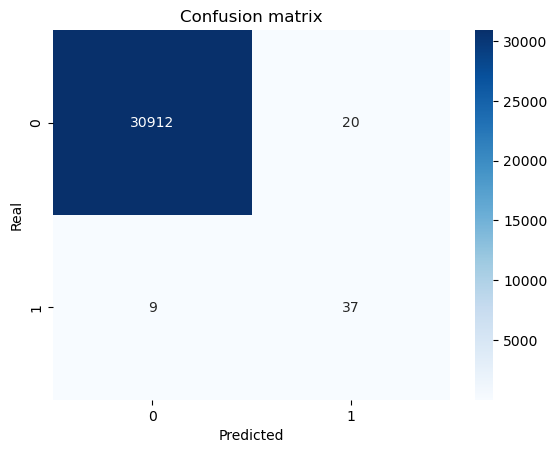

969/969 [==============================] - 0s 285us/step
AUC: 0.9237668602657161


In [78]:
# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Real")
plt.title("Confusion matrix")
plt.show()

from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, model.predict(X_test_norm))
print("AUC:", auc)

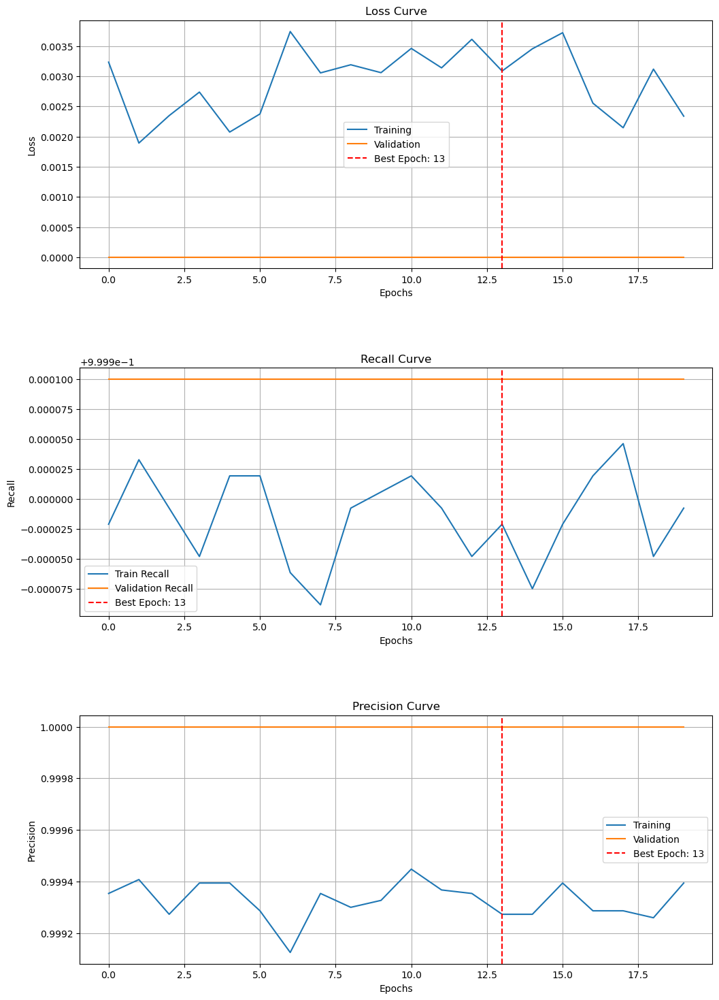

In [79]:
nnf.plot_training_curves(history)

In [ ]:
#model.save("modelo_liver_cancer.h5")  # Guardar modelo
#loaded_model = keras.models.load_model("modelo_liver_cancer.h5")  # Cargarlo después

In [ ]:
#loaded_model = keras.models.load_model("modelo_liver_cancer.h5")

# SHAP
---

In [85]:
shap.initjs()

In [105]:
X_train_norm_df = pd.DataFrame(X_train_norm, columns=feature_names)

X_train_original_df = pd.DataFrame(X_train_res, columns=feature_names)
sex_original = X_train_original_df["sex"].values

explainer = shap.Explainer(model, X_train_norm)  

# Summary plot
---

In [108]:
num_samples = 1000 
X_train_subset = X_train_norm_df[:num_samples]
shap_values = explainer(X_train_subset)

PermutationExplainer explainer: 1001it [00:30, 21.94it/s]                         


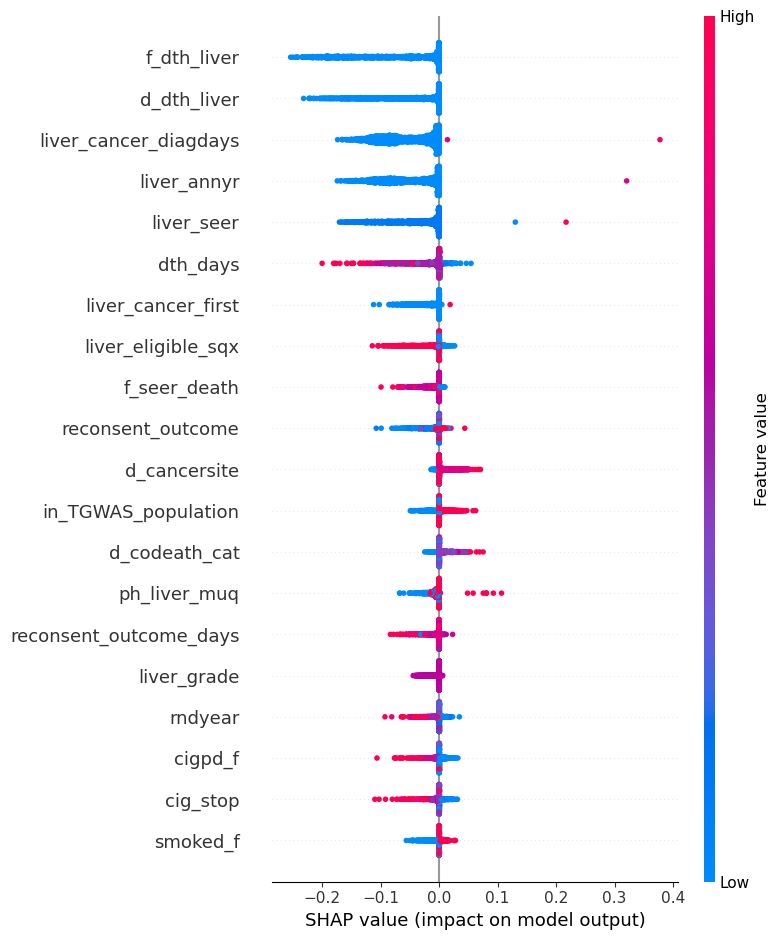

In [109]:
shap.summary_plot(shap_values, X_train_subset[:num_samples], feature_names=feature_names) 

# Plot bars
---

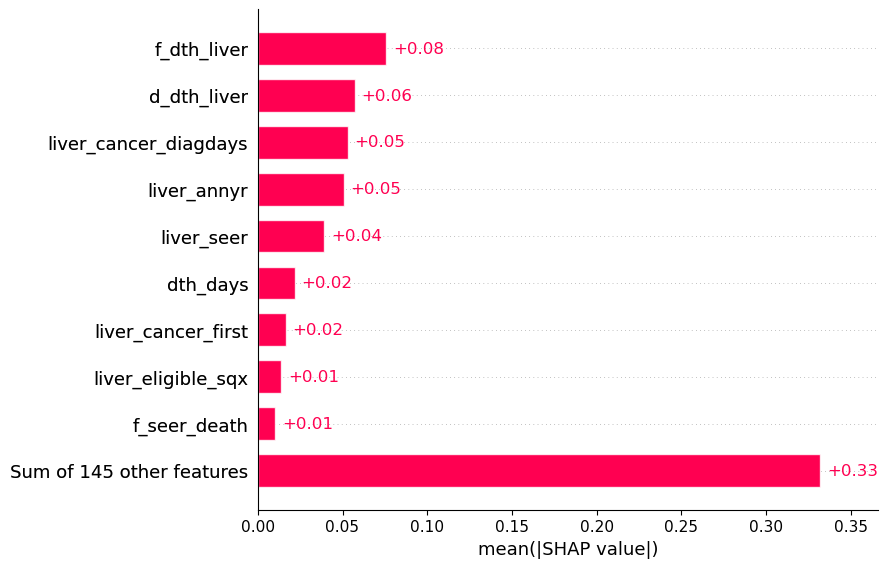

In [111]:
shap.plots.bar(shap_values)

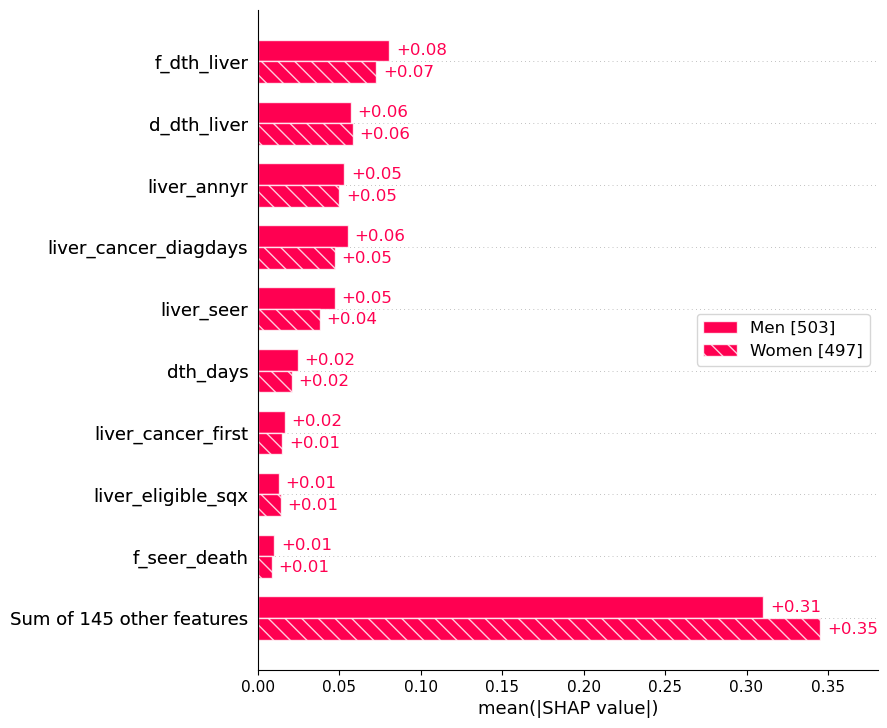

In [123]:
sex_labels = np.array(["Women" if sex_original[i] == 2 else "Men" for i in range(num_samples)])
shap_cohorts = shap_values.cohorts(sex_labels)
shap.plots.bar(shap_cohorts.abs.mean(0))

# Beeswarm plot
---

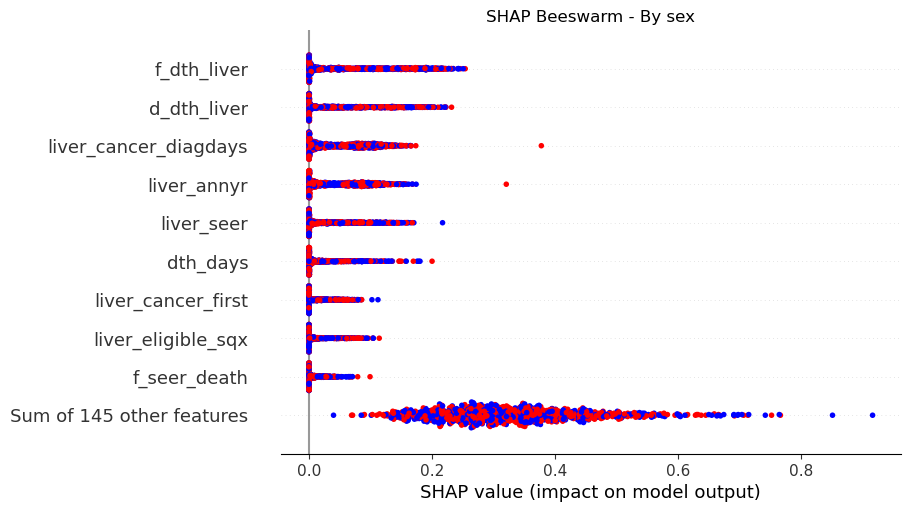

In [119]:
sex_labels_numeric = np.array([0 if sex_original[i] == 1 else 1 for i in range(num_samples)])

cmap = cm.bwr
color_values = cmap(sex_labels_numeric / max(sex_labels_numeric))

plt.figure(figsize=(10, 6))
plt.title("SHAP Beeswarm - By sex")
shap.plots.beeswarm(shap_values.abs, color=color_values)
plt.show()

# Force plot
---

In [122]:
num_samples = 1000 
X_train_subset = X_train_norm_df[:num_samples]
shap_values = explainer(X_train_subset)

expected_value = shap_values.base_values.mean()
shap_values_data = shap_values.values 

shap.initjs()
shap.force_plot(expected_value, shap_values_data, X_train_subset, feature_names=feature_names)

PermutationExplainer explainer: 1001it [00:32, 21.18it/s]                          
